# Выпускная квалификационная работа - 1 Разведочный анализ  данных

1. Провести разведочный анализ предложенных данных
 * нарисовать гистограммы распределения каждой из переменной,
 * диаграммы ящика с усами, попарные графики рассеяния точек.
 * необходимо также для каждой колонке получить среднее, медианное значение, 
 * провести анализ и исключение выбросов,
 * проверить наличие пропусков.     


In [40]:
# import warnings; warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use("seaborn-v0_8-whitegrid")
sns.set_style("whitegrid")

import os

## Загрузка данных

In [41]:
df_bp = pd.read_excel('data/X_bp_original.xlsx', index_col=0)
df_bp.sample(11)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
343,2.334624,1984.314513,316.979375,56.636567,26.372176,274.873467,312.585304,71.702668,2122.101655,195.297699
894,1.241903,1941.719354,1099.211000,120.842760,15.881668,354.394547,280.473006,70.493334,2599.820384,171.944135
237,5.591742,2121.579070,923.668248,121.713099,21.809294,289.772089,134.349865,74.192008,2203.674811,290.173270
439,1.872760,2069.446242,921.751025,149.517161,25.269367,315.006026,126.591897,69.175075,2029.265957,194.207851
566,1.620786,1901.357022,842.301190,151.259793,22.878357,314.622062,519.668523,74.615810,2199.094352,300.534497
779,2.159406,2014.646229,974.189159,104.042877,24.141653,296.632507,667.781436,74.785578,2316.116707,219.179155
66,4.414161,2014.623318,607.061635,104.097859,20.778634,227.513311,654.548803,77.046588,2241.463611,281.270928
179,4.422466,1945.323699,636.831057,127.661351,20.527696,249.291603,646.632354,78.259089,2934.865728,197.557822
316,3.572790,1992.344782,724.109184,129.947268,22.013615,304.940980,914.470728,74.611652,2657.574875,164.448443
129,1.746458,1885.724004,686.269535,106.704606,20.575594,263.362796,182.225521,77.094895,2364.796770,256.283235


In [42]:
pd.DataFrame(df_bp.columns, columns=['признаки базальтопластик'])

,признаки базальтопластик
0,Соотношение матрица-наполнитель
1,"Плотность, кг/м3"
2,"модуль упругости, ГПа"
3,"Количество отвердителя, м.%"
4,"Содержание эпоксидных групп,%_2"
5,"Температура вспышки, С_2"
6,"Поверхностная плотность, г/м2"
7,"Модуль упругости при растяжении, ГПа"
8,"Прочность при растяжении, МПа"
9,"Потребление смолы, г/м2"


In [43]:
print('наблюдений: %i, признаков: %i в X_bp' % df_bp.shape)

наблюдений: 1023, признаков: 10 в X_bp


In [44]:
df_nup = pd.read_excel('data/X_nup_original.xlsx', index_col=0)
df_nup

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.000000,57.000000
1,0,4.000000,60.000000
2,0,4.000000,70.000000
3,0,5.000000,47.000000
4,0,5.000000,57.000000
...,...,...,...
1035,90,8.088111,47.759177
1036,90,7.619138,66.931932
1037,90,9.800926,72.858286
1038,90,10.079859,65.519479


In [45]:
pd.DataFrame(df_nup.columns, columns=['признаки нашивок'])

,признаки нашивок
0,"Угол нашивки, град"
1,Шаг нашивки
2,Плотность нашивки


In [46]:
print('строк: %i, признаков: %i в X_nup' % df_nup.shape)

строк: 1040, признаков: 3 в X_nup


In [47]:
df = df_bp.join(df_nup, how='left')
df.sample(8).T

,460,529,433,3,541,901,806,585
Соотношение матрица-наполнитель,3.096419,3.916135,2.847259,1.857143,2.694356,3.395715,3.976382,3.355421
"Плотность, кг/м3",2040.229870,1830.332164,1934.263621,2030.000000,1900.447879,1935.189902,2052.028890,1995.549153
"модуль упругости, ГПа",536.663039,471.506958,625.785726,738.736842,778.356422,356.398132,814.842960,984.742073
"Количество отвердителя, м.%",168.536509,133.312208,82.702938,129.000000,43.454556,79.653191,110.689775,110.738213
"Содержание эпоксидных групп,%_2",19.417348,19.918813,24.251486,21.250000,25.437709,23.069705,21.932620,24.696093
"Температура вспышки, С_2",329.517248,209.999731,300.768841,300.000000,268.521892,251.923557,351.771502,193.431144
"Поверхностная плотность, г/м2",1288.691844,241.219283,541.150916,210.000000,409.637966,451.313045,1012.292944,772.566280
"Модуль упругости при растяжении, ГПа",69.367179,73.519831,72.520109,70.000000,73.709184,70.790503,70.866458,73.963857
"Прочность при растяжении, МПа",1831.362292,2826.723248,2774.432614,3000.000000,1727.395939,1633.427466,3372.771114,1348.288251
"Потребление смолы, г/м2",246.666401,304.184250,350.360853,220.000000,63.685698,246.086218,192.457518,280.880603


In [48]:
print(F'строк: {df.shape[0]}, столбцов: {df.shape[1]} в df, {df_nup.shape[0] - df_bp.shape[0]} строк было отброшено после объединения файлов')

строк: 1023, столбцов: 13 в df, 17 строк было отброшено после объединения файлов


In [49]:
# колонки с вещественными признаками
cols_numerical = df.loc[:, df.columns != 'Угол нашивки, град']
cols_numerical.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,5.0,57.0


In [50]:
column_categorical = df.loc[:, df.columns == 'Угол нашивки, град']
column_categorical.head()

,"Угол нашивки, град"
0,0
1,0
2,0
3,0
4,0


In [51]:
df.info() # Пропуски отсутствуют, тип данных: float64, кроме (Угол нашивки, град) тип: int64, строковых значений нет

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

In [52]:
df.nunique() # Количество уникальных значений

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [53]:
round((df.nunique() / 1023), 4) * 100 # Количество уникальных значений в процентах dd

Соотношение матрица-наполнитель         99.12
Плотность, кг/м3                        99.02
модуль упругости, ГПа                   99.71
Количество отвердителя, м.%             98.24
Содержание эпоксидных групп,%_2         98.14
Температура вспышки, С_2                98.04
Поверхностная плотность, г/м2           98.14
Модуль упругости при растяжении, ГПа    98.14
Прочность при растяжении, МПа           98.14
Потребление смолы, г/м2                 98.04
Угол нашивки, град                       0.20
Шаг нашивки                             96.68
Плотность нашивки                       96.58
dtype: float64

In [54]:
df.describe().style.format(precision=2)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00
mean,2.93,1975.73,739.92,110.57,22.24,285.88,482.73,73.33,2466.92,218.42,44.25,6.90,57.15
std,0.91,73.73,330.23,28.30,2.41,40.94,281.31,3.12,485.63,59.74,45.02,2.56,12.35
min,0.39,1731.76,2.44,17.74,14.25,100.00,0.60,64.05,1036.86,33.80,0.00,0.00,0.00
25%,2.32,1924.16,500.05,92.44,20.61,259.07,266.82,71.25,2135.85,179.63,0.00,5.08,49.80
50%,2.91,1977.62,739.66,110.56,22.23,285.90,451.86,73.27,2459.52,219.20,0.00,6.92,57.34
75%,3.55,2021.37,961.81,129.73,23.96,313.00,693.23,75.36,2767.19,257.48,90.00,8.59,64.94
max,5.59,2207.77,1911.54,198.95,33.00,413.27,1399.54,82.68,3848.44,414.59,90.00,14.44,103.99


In [55]:
df['Угол нашивки, град'].value_counts() #'Угол нашивки, град' 2 уникальных занчения

0     520
90    503
Name: Угол нашивки, град, dtype: int64

In [56]:
df['Угол нашивки, град'].value_counts(normalize=True) * 100 # в процентах 

0     50.83089
90    49.16911
Name: Угол нашивки, град, dtype: float64

In [57]:
df.isnull().sum() # пропуски в данных отсутствуют

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [58]:
df.duplicated().sum() # дубликаты в данных отсутствуют

0

In [59]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


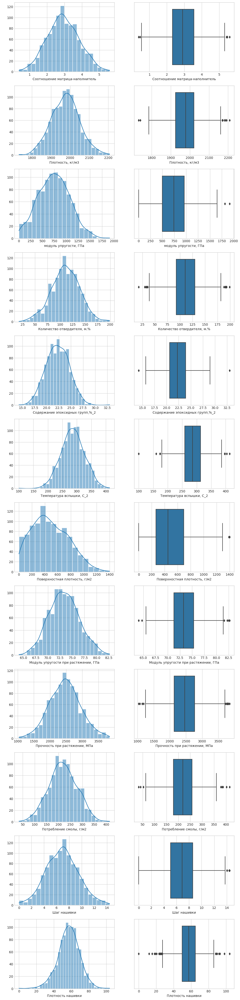

In [60]:
# графики распределения переменных и "ящики с усами"
fig, axes = plt.subplots(cols_numerical.shape[1], 2, figsize=(12, 54))
for el, column in enumerate(cols_numerical):
    axes[el, 0].set(ylabel=' ')
    sns.histplot(data=df, x=column, kde=True, ax=axes[el, 0], )
    sns.boxplot(data=df, x=column, ax=axes[el, 1])
plt.show()

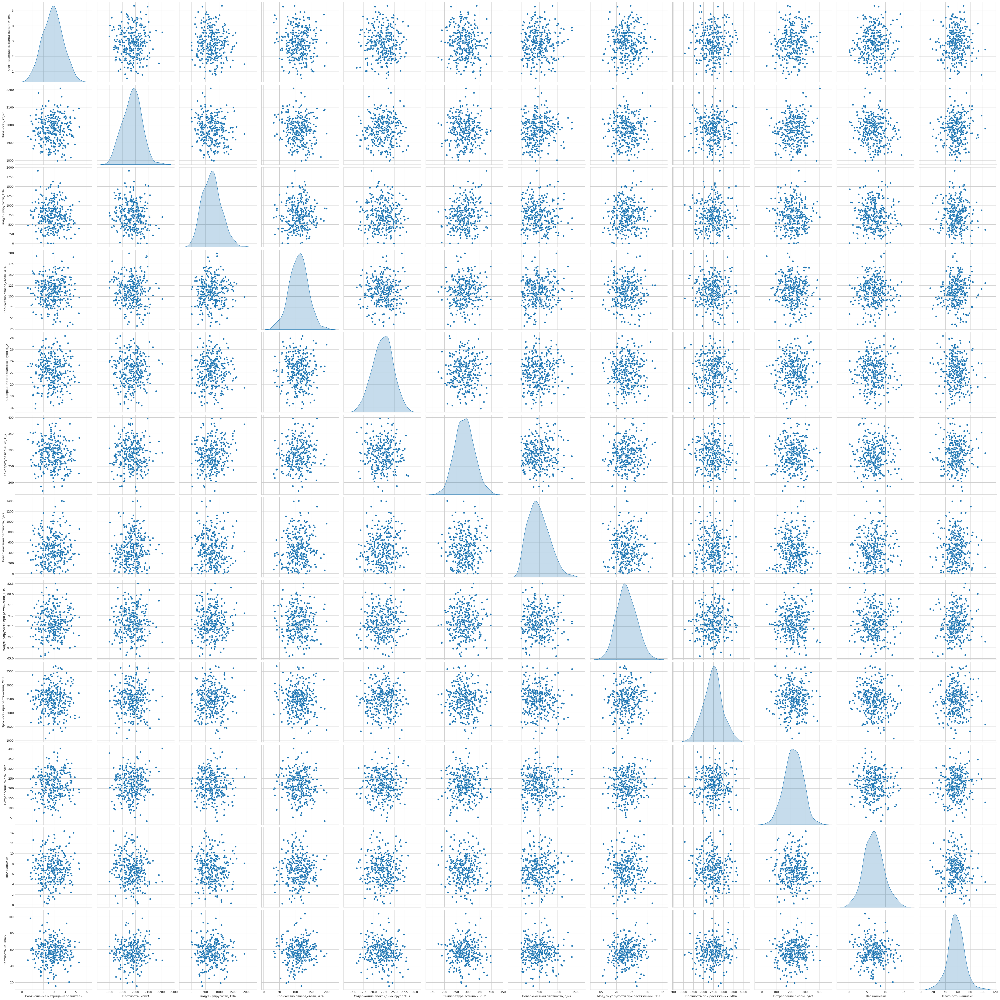

In [61]:
sns.pairplot(df.sample(frac=0.5), height=4, diag_kind='kde', vars=cols_numerical)
plt.show()


In [62]:
# на графиках заметны выбросы
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,44.252199,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,45.015793,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,90.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,90.000000,14.440522,103.988901


In [63]:
cols_numerical.skew().sort_values(ascending=False)

Поверхностная плотность, г/м2           0.395466
Модуль упругости при растяжении, ГПа    0.127283
модуль упругости, ГПа                   0.120174
Шаг нашивки                             0.101997
Соотношение матрица-наполнитель         0.082271
Прочность при растяжении, МПа           0.078565
Плотность, кг/м3                        0.058629
Содержание эпоксидных групп,%_2         0.054258
Потребление смолы, г/м2                 0.006294
Температура вспышки, С_2               -0.056526
Количество отвердителя, м.%            -0.086197
Плотность нашивки                      -0.229535
dtype: float64

In [64]:
cols_numerical.kurt().sort_values(ascending=False)

Плотность нашивки                       0.860696
Температура вспышки, С_2                0.187924
Количество отвердителя, м.%             0.145763
Плотность, кг/м3                        0.063629
Содержание эпоксидных групп,%_2         0.042634
Прочность при растяжении, МПа           0.022146
Шаг нашивки                            -0.012810
Потребление смолы, г/м2                -0.124173
Модуль упругости при растяжении, ГПа   -0.161389
Соотношение матрица-наполнитель        -0.199334
модуль упругости, ГПа                  -0.206331
Поверхностная плотность, г/м2          -0.439103
dtype: float64

In [65]:
df.shape[0]

1023

In [66]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
df = df[~((df < (Q1 - 1.5 * IQR) ) | (df > (Q3 + 1.5 * IQR)))]
# количество удаленных выбросов по строкам 
df.isna().sum()

Соотношение матрица-наполнитель          6
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             14
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 8
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           11
Потребление смолы, г/м2                  8
Угол нашивки, град                       0
Шаг нашивки                              4
Плотность нашивки                       21
dtype: int64

In [67]:
# всего  удаленных выбросов 
df.isna().sum().sum()

93

In [68]:
df = df.dropna(axis=0).reset_index(drop=True)
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
1,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
2,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0
3,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,60.0
4,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,70.0


In [69]:
# осталось строк
df.shape[0]

936

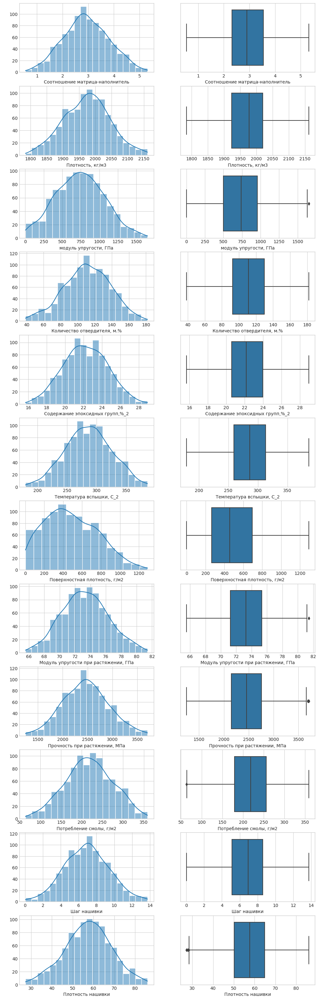

In [70]:
# графики распределения переменных и "ящики с усами" после удаления выбросов
fig, axes = plt.subplots(cols_numerical.shape[1], 2, figsize=(12, 40))
for el, column in enumerate(cols_numerical):
    axes[el, 0].set(ylabel=' ')
    sns.histplot(data=df, x=column, kde=True, ax=axes[el, 0])
    sns.boxplot(data=df, x=column, ax=axes[el, 1])
plt.show()

##  Распределения переменных после удаления выбросов 

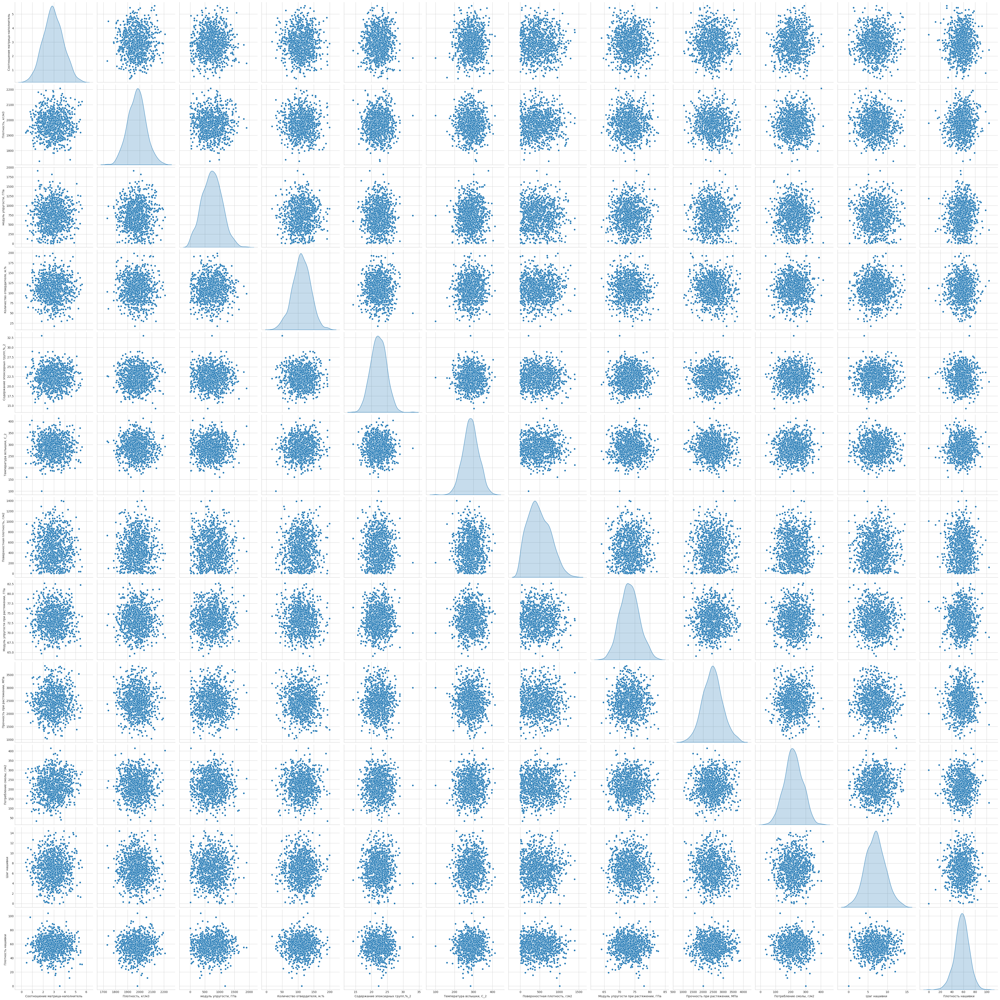

In [71]:
sns.pairplot(df.sample(frac=0.5), height=4, diag_kind='kde', vars=cols_numerical)
plt.show()

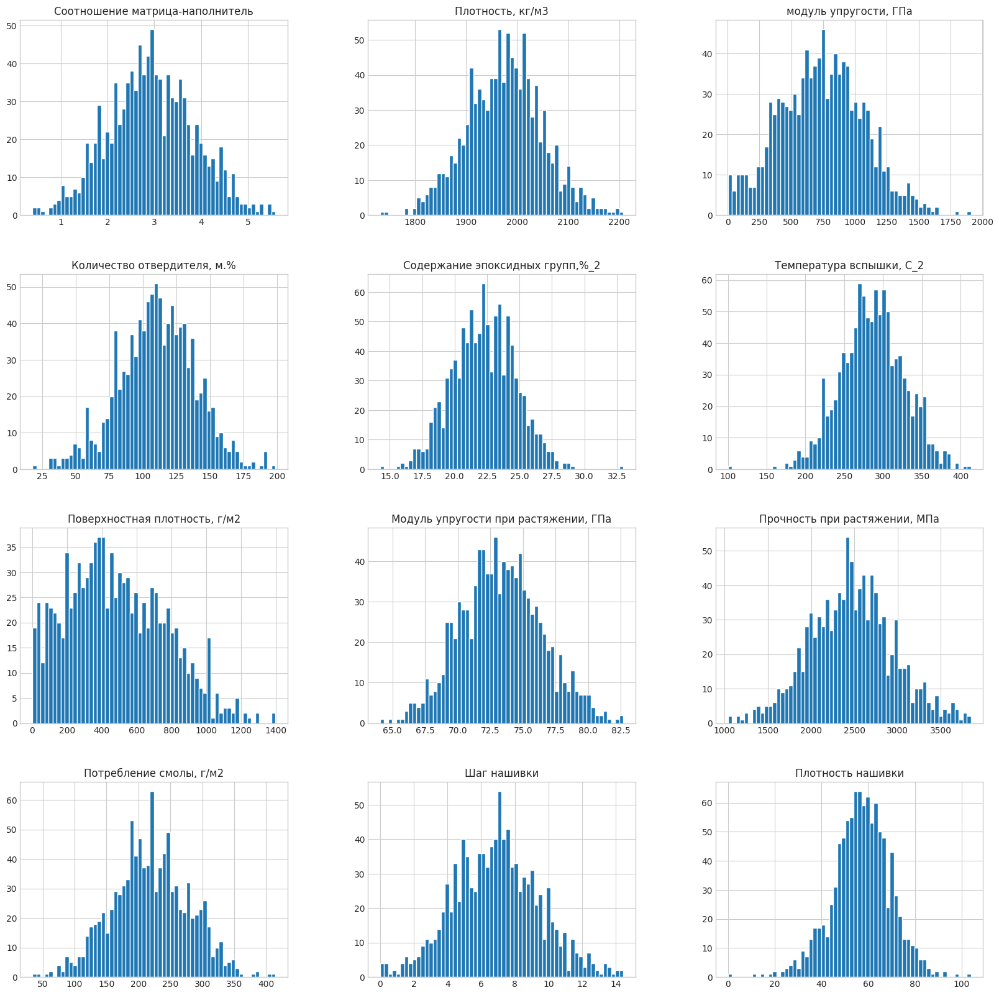

In [72]:
cols_numerical.hist(figsize=(20,20), bins=60)
plt.show()

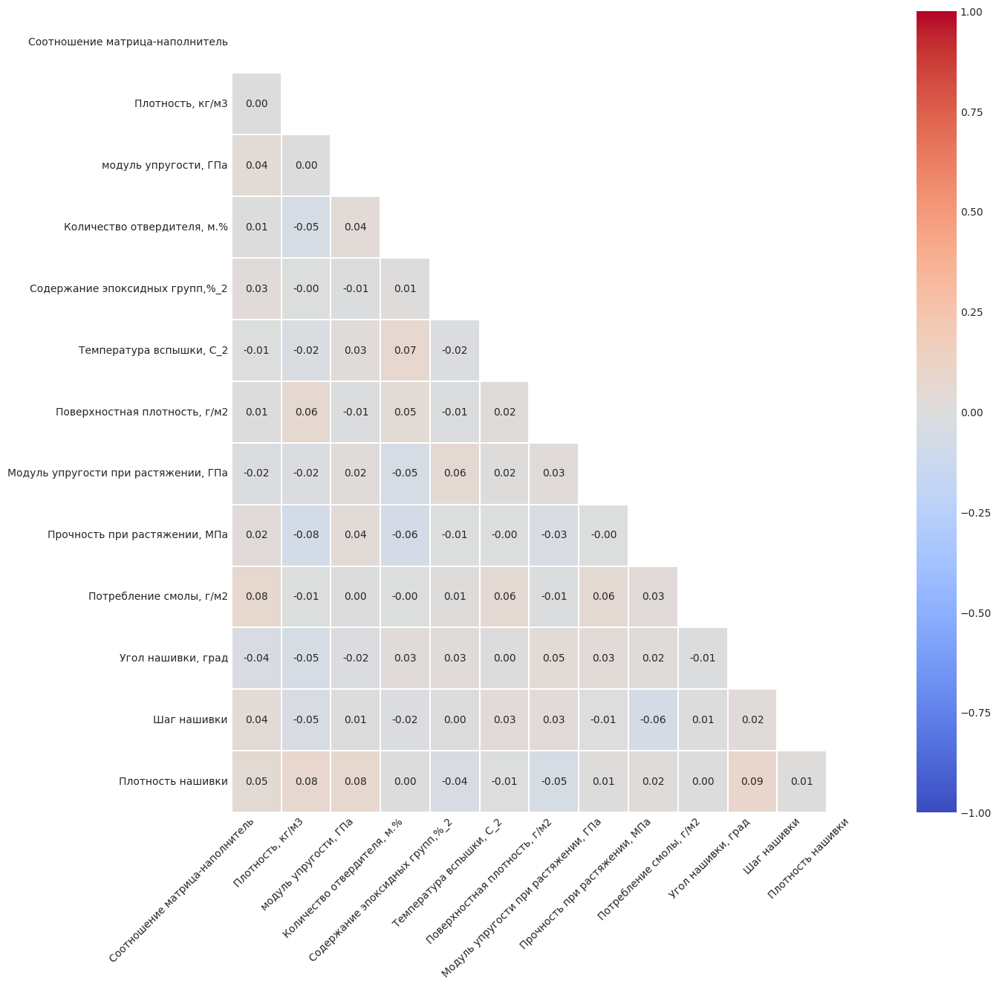

In [73]:
fig, ax = plt.subplots(figsize=(14,14))
mask = np.triu(df.corr())
sns.heatmap(df.corr(), mask=mask, cmap='coolwarm', annot=True, linewidths=0.1 , fmt='.2f', vmin=-1, vmax=1, center=0)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

#### корреляция очень слабая

In [74]:
df.shape

(936, 13)

In [75]:
# Данные очищенные от выбросов - запись в файл xlsx
if os.path.getsize('data/data_outliers_cleaned.xlsx') == 158474:
    print('file exist')
else:
    df.to_excel('data/data_outliers_cleaned.xlsx')

file exist
